In [45]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler

from components.HistoryGraph import HistoryGraph
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
import warnings
warnings.filterwarnings('ignore')
from sklearn.svm import SVC
from components.lib import execute_graph
from components.lib import view_dictionary, graphviz_draw
from components.parser.parser import extract_artifact_graph
from dictionary.Evaluator.Classification.F1_score import F1ScoreCalculator
from dictionary.Preprocessor.PCA.GPU__PCA import GPU__PCA
from dictionary.Preprocessor.PCA.GPU_SS_PCA import GPU_SS_PCA
from dictionary.Preprocessor.PCA.TR__PCA import TR__PCA
Hyppo = HistoryGraph("History")


<img src="intro.png" alt="image" width="1200" height="auto">

# Hyppo simplifies the process of:

1. Review existing pipelines
2. Modifying existing pipelines

It achieves that by using a History graph, which records datasets, pipelines, operators, metrics and their relationships.
A dictionary that stores operators. 




# Collaborative fueled discovery with Hyppo
---

In [1]:
Hyppo.view_datasets()

NameError: name 'Hyppo' is not defined

In [48]:
dataset_id = "HIGGS"

In [49]:
Hyppo.best_metrics_achieved(dataset_id)

,operator,highest_value,lowest_value
0,AccuracyCalculator,0.945667,0.807333
1,F1ScoreCalculator,1.244000,1.162333
2,MAECalculator,0.150333,0.150333


In [50]:
Hyppo.retrieve_best_pipelines(dataset_id, metric = "F1ScoreCalculator", N=3)

,F1ScoreCalculator,Pipeline
0,1.244000,"[SimpleImputer(), DecisionTreeClassifier(), F1..."
1,1.190000,"[StandardScaler(), PCA(n_components=3), Random..."
2,1.162333,"[StandardScaler(), PCA(n_components=3), Decisi..."


In [ ]:
user1_pipe = Pipeline([('scaler', StandardScaler()), ('pca', PCA(n_components=3)), ('SVC', SVC()), ('F1', F1ScoreCalculator())])

# Pipeline Modification and Exploration

---

In [51]:
Hyppo.popular_operators(dataset_id)

,Operator,Frequency
0,PCA(n_components=3),130
1,StandardScaler(),98
2,SimpleImputer(),60
5,DecisionTreeClassifier(),24
6,F1ScoreCalculator,24
7,SVC(),18
8,AccuracyCalculator,18
9,RandomForestClassifier(random_state=42),12
10,MAECalculator,12


In [ ]:
Hyppo.view_dictionary()

In [ ]:
Hyppo.view_dictionary(type= "Preprocessor", objective="PCA")

In [52]:
Hyppo.popular_unused_operators(dataset_id=dataset_id, objective="PCA")

,Implementation,Frequency
27,GPU_SS_PCA,20
28,GPU__PCA,93
29,PCA_TensorFlow,39
30,TR__PCA,88


In [53]:
%%time
user1_pipe = Pipeline([('scaler', StandardScaler()), ('pca', GPU__PCA(n_components=3)), ('SVC', SVC()), ('F1', F1ScoreCalculator())])
Hyppo.execute_and_add(dataset_id, user1_pipe)

F1 Score:  1.1512
Wall time: 1.91 s


('HISKStGPPCSKSVSKF12886_score',
 Pipeline(steps=[('scaler', StandardScaler()), ('pca', GPU__PCA(n_components=3)),
                 ('SVC', SVC()), ('F1', F1ScoreCalculator())]))

# Pipeline optimization with Hyppo
---

In [54]:
%%time
optimized_pipe = Hyppo.optimize_pipeline(dataset_id, user1_pipe)
compute_tasks, load_tasks, request = execute_graph('HIGGS', optimized_pipe)
request

Wall time: 189 ms


1.1512

In [55]:
load_tasks

['HISKStGPPCSKSVSKF12886_score']

In [ ]:
compute_tasks

# Extending Dictionary

In [56]:
%%writefile dictionary/Evaluator/Classification/F2ScoreCalculator.py
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.metrics import fbeta_score

class F2ScoreCalculator(BaseEstimator, TransformerMixin):
    def __init__(self, y_true=None, average='micro'):
        self.y_true = y_true
        self.average = average

    def fit(self, X, y=None):
        self.y_true = X
        return self

    def score(self, X):
        f2 = fbeta_score(self.y_true, X, beta=2, average=self.average)
        return f2

Writing dictionary/Evaluator/Classification/F2ScoreCalculator.py


In [57]:
%%time
from dictionary.Evaluator.Classification.F2ScoreCalculator import F2ScoreCalculator
user1_pipe = Pipeline([('scaler', StandardScaler()), ('pca', GPU__PCA(n_components=3)), ('SVC', SVC()), ('F2', F2ScoreCalculator())])
Hyppo.execute_and_add(dataset_id, user1_pipe)

Wall time: 1.64 s


('HISKStGPPCSKSVSKF22886_score',
 Pipeline(steps=[('scaler', StandardScaler()), ('pca', GPU__PCA(n_components=3)),
                 ('SVC', SVC()), ('F2', F2ScoreCalculator())]))

In [58]:
Hyppo.best_metrics_achieved(dataset_id)

,operator,highest_value,lowest_value
0,AccuracyCalculator,0.945667,0.807333
1,F1ScoreCalculator,1.244000,1.151200
2,F2ScoreCalculator,0.851200,0.851200
3,MAECalculator,0.150333,0.150333


# Hyppo Overview
![alt text](HYPPO_v3.png)
---
### 1) Hyppo's Parser

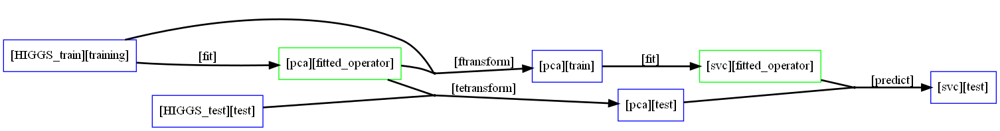

'HISKPCSKSV9009_predict'

In [59]:
from components.lib import interactive_graphviz_draw

user1_pipe = Pipeline([('pca', PCA(n_components=3)), ('svc', SVC())])
artifact_graph, request = extract_artifact_graph(dataset_id, user1_pipe)
graphviz_draw(artifact_graph, type='notebook',  mode='use_alias')
request

In [ ]:
graphviz_draw(artifact_graph, type='notebook',  mode='use_alias')

### 2) Hyppo's History

In [60]:
Hyppo.visualize(type='notebook', mode='use_alias')

### 3) Augmenter

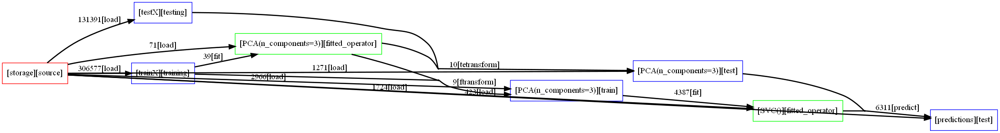

In [61]:
#History.printArtifacts() #HISKStSKPC4529_ftransform
Hyppo.visualize_augmented(dataset_id, type='notebook', mode='use_alias', filter_artifact_id="HISKPCSKSV9009_predict", filter = 'retrieve')

In [62]:
plans= Hyppo.generate_plans(dataset_id, user1_pipe)

HISKPCSKSV9009_predict
['HISKPCSKSV9009_predict']


In [63]:
plans

[[423,
  ['HISKPCSKSV9009_predict']],
 [9306,
  ['HISKPCSKSV9009_predict']],
 [14935,
  ['HISKPCSKSV9009_predict']],
 [139507,
  ['HISKPCSKSV9009_predict']],
 [145136,
  ['HISKPCSKSV9009_predict']],
 [318626,
  ['HISKPCSKSV9009_predict']],
 [446052,
  ['HISKPCSKSV9009_predict']],
 [448827,
  ['HISKPCSKSV9009_predict']],
 [451681,
  ['HISKPCSKSV9009_predict']],
 [448795,
  ['HISKPCSKSV9009_predict']],
 [625171,
  ['HISKPCSKSV9009_predict']],
 [755372,
  ['HISKPCSKSV9009_predict']],
 [755340,
  ['HISKPCSKSV9009_predict']]]

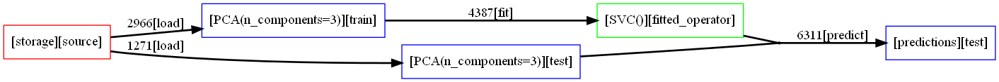

In [66]:
graphviz_draw(plans[2][1], 'notebook','use_alias')

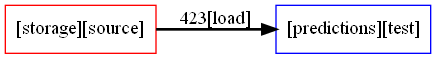

In [67]:
pipe = Hyppo.optimal_retrieval_plan(dataset_id,["HISKPCSKSV9009_predict"])
graphviz_draw(pipe[0][1], 'notebook','use_alias')